In [1]:
#!/usr/bin/python3
import math
import numpy as np
import os
import glob
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as mplcolor
import seaborn as sns
from statsmodels.tsa.stattools import grangercausalitytests
from scipy.stats import spearmanr, pearsonr  
from statsmodels.tsa.seasonal import STL
from sklearn.ensemble import IsolationForest

# DATA

In [2]:
df_cc = pd.read_csv("data/countries-capitals-europe.csv", index_col=0)

df_cc

,country,capital,language
0,Netherlands,Amsterdam,"['Dutch; Flemish', 'Western Frisian']"
1,Andorra,Andorra la Vella,['Catalan; Valencian']
2,Greece,Athens,"['Greek, Modern (1453-)']"
3,Azerbaijan,Baku,['Azerbaijani']
4,Northern Ireland,Belfast,['Irish']
5,Serbia,Belgrade,['Serbian']
6,Germany,Berlin,['German']
7,Switzerland,Bern,"['French', 'German', 'Italian', 'Romansh']"
8,Slovakia,Bratislava,['Slovak']
9,Belgium,Brussels,"['Dutch; Flemish', 'French', 'German']"


## UNHCR data
### Number of Ukrainian refugees in Europe as October 2023 according to UNHCR's website
https://data.unhcr.org/en/situations/ukrdemo?secret=unhcrrestricted

In [3]:
df_unhcr = pd.read_csv("data_official/UNHCR_ukrainian_refugees_europe_data.csv", index_col=0)
df_unhcr.replace({"Russian Federation": "Russia", 
                 "Republic of Moldova": "Moldova", 
                 "Türkiye": "Turkey", 
                 "Serbia and Kosovo: S/RES/1244 (1999)": "Serbia"}, inplace=True)

df_unhcr.head(5)

,geomaster_name,individuals,source,population_groups_concat
0,Germany,1243447,"Government, UNHCR",Individual refugees from Ukraine recorded acro...
1,Russia,1223795,"Government, UNHCR",Individual refugees from Ukraine recorded acro...
2,Poland,999708,"Government, UNHCR",Individual refugees from Ukraine recorded acro...
3,Czech Republic,401348,"Government, UNHCR",Individual refugees from Ukraine recorded acro...
4,United Kingdom,254034,"Government, UNHCR",Individual refugees from Ukraine recorded acro...


In [4]:
df_unhcr = df_unhcr.merge(df_cc, right_on="country", left_on="geomaster_name", how="inner")

rank_UNHCR = df_unhcr[["country", "capital", "individuals"]].sort_values(by="individuals", ascending=False).set_index("capital")
rank_UNHCR.columns = ["country", "UNHCR Ukrainian refugees stocks"]
rank_UNHCR2 = rank_UNHCR.drop(columns=["country"])
rank_UNHCR2 = rank_UNHCR2.sort_values(by="UNHCR Ukrainian refugees stocks", ascending=False)
#rank_UNHCR2 = rank_UNHCR2.head(36) #countries with at least 10k Ukrainian refugees

## Eurostat data

In [5]:
df_eurostat = pd.read_csv("data_official/Europe/UK_in_EU_stocks.csv", index_col=0, skiprows=[1]) 

rank_EU = df_eurostat.merge(df_cc[["country", "capital"]].replace({"Czech Republic": "Czechia"}), left_index=True, right_on="country").set_index("capital")
rank_EU2 = rank_EU.drop(columns=["country"])

rank_EU_long = rank_EU.melt(id_vars=["country"], var_name="Years", value_name="Temporary protection stocks", ignore_index=False)
rank_EU_long["Years"] = rank_EU_long["Years"].astype(int)
rank_EU2_long = rank_EU_long.drop(columns="country")
rank_EU2_long

,Years,Temporary protection stocks
capital,,
Brussels,2022,61760
Sofia,2022,146805
Prague,2022,431310
Copenhagen,2022,31815
Berlin,2022,936375
...,...,...
Stockholm,2024,45890
Reykjavík,2024,3990
Vaduz,2024,700


In [6]:
rank_EU.sort_values("2022", ascending=False) # example top countries Ukrainian refugee stocks

,2022,2023,2024,country
capital,,,,
Warsaw,956760,951435,986920,Poland
Berlin,936375,1211785,1125985,Germany
Prague,431310,372145,387810,Czechia
Madrid,158310,191080,222190,Spain
Sofia,146805,170250,68535,Bulgaria
Rome,145005,160515,162295,Italy
Amsterdam,102550,111850,118870,Netherlands
Bucharest,99930,144455,177915,Romania
Bratislava,94975,113590,130790,Slovakia


In [7]:
print(set(rank_UNHCR2.index).difference(set(rank_EU2.index)))

{'Tirana', 'London', 'Moscow', 'Tbilisi', 'Ankara', 'Minsk', 'Chișinău', 'Belgrade', 'Baku', 'Sarajevo', 'Skopje', 'Podgorica'}


In [8]:
rank_EU2.merge(rank_UNHCR2, left_index=True, right_index=True).corr() 
# Data from UNHCR is from Oct 2023
# The corr between eurostat 2023 and UNHCR is 0.99 :)

,2022,2023,2024,UNHCR Ukrainian refugees stocks
2022,1.000000,0.986416,0.989434,0.984462
2023,0.986416,1.000000,0.994715,0.996441
2024,0.989434,0.994715,1.000000,0.998667
UNHCR Ukrainian refugees stocks,0.984462,0.996441,0.998667,1.000000


## Polish data: PESEL stocks during the period 17.04.2022 - 12.08.2025    
### PESEL stocks in 2022 (26.12.2022), 2023 (12.12.2023), and 2024 (10.12.2024)

In [9]:
df_poland = pd.read_csv("data_official/Poland/UK_in_PL_stocks.csv", index_col=0)
df_poland.rename(columns={"WARSZAWA": "WARSAW"}, inplace=True)

rank_poland = df_poland

rank_poland_long = rank_poland.reset_index().melt(id_vars="Location", var_name="Years", value_name="PESEL stocks", ignore_index=False).set_index("Location")
rank_poland_long["Years"] = rank_poland_long["Years"].astype(int)
rank_poland_long

,Years,PESEL stocks
Location,,
Białystok,2022,3269
Bydgoszcz,2022,9245
Częstochowa,2022,4685
Gdańsk,2022,16499
Gdynia,2022,8754
Gliwice,2022,4934
Katowice,2022,10520
Kielce,2022,3385
Kraków,2022,29491


## German data: Total temporarily recognised protection status by month
### Temporary protection in 2022, 2023, and 2024

In [10]:
df_germany = pd.read_csv("data_official/Germany/UK_in_DE_stocks.csv", index_col=0)

rank_germany = df_germany

rank_germany_long = rank_germany.reset_index().melt(id_vars="Location", var_name="Years", value_name="Temporary protection stocks", ignore_index=False).set_index("Location")
rank_germany_long["Years"] = rank_germany_long["Years"].astype(int)
rank_germany_long

,Years,Temporary protection stocks
Location,,
Aachen,2022,5950
Augsburg,2022,5140
Berlin,2022,50495
Bielefeld,2022,4215
Bochum,2022,7525
...,...,...
Oberhausen,2024,3510
Rostock,2024,3160
Stuttgart,2024,7210


## Wikipedia data

In [11]:
def get_yearly_wikis(region="EU", loc_col="Location"):

    # use glob to get all the csv files in the folder
    path = os.getcwd()
    csv_files = glob.glob(os.path.join(path, f"data_cities_{region}/preprocessed/*prop-yearly*.csv"))
    
    dfs = []
    for f in csv_files:
        city = city = f.split("\\")[-1].split("-")[0].replace(",", " ") 
        df = pd.read_csv(f)  # adjust sep if comma-separated
        df[loc_col] = city
        dfs.append(df)
    
    # Combine all into one long dataframe
    df_wikis = pd.concat(dfs, ignore_index=True).set_index(loc_col)

    return df_wikis

In [12]:
df_wikis_eu = get_yearly_wikis(region="EU", loc_col="capital")
df_wikis_pl = get_yearly_wikis(region="PL", loc_col="Location")
df_wikis_de = get_yearly_wikis(region="DE", loc_col="Location")

In [13]:
df_wikis_pl[["Years", "Ukrainian", "Russian", "English"]].sort_values("Ukrainian", ascending=False).head(20)

,Years,Ukrainian,Russian,English
Location,,,,
Warsaw,2022,0.000081,0.000032,0.000014
Warsaw,2023,0.000072,0.000032,0.000012
Kraków,2022,0.000066,0.000022,0.000009
Wrocław,2022,0.000065,0.000022,0.000007
Kraków,2023,0.000065,0.000020,0.000009
Warsaw,2024,0.000065,0.000025,0.000011
Wrocław,2023,0.000061,0.000022,0.000007
Wrocław,2024,0.000059,0.000019,0.000007
Kraków,2024,0.000056,0.000016,0.000008


In [14]:
df_wikis_de[["Years", "Ukrainian", "Russian", "English"]].sort_values("Ukrainian", ascending=False).head(20)

,Years,Ukrainian,Russian,English
Location,,,,
Berlin,2023,0.000062,0.000038,0.000021
Berlin,2022,0.000061,0.000038,0.000021
Berlin,2024,0.000059,0.000034,0.000019
Berlin,2021,0.000047,0.000035,0.000018
Berlin,2020,0.000047,0.000038,0.000016
Munich,2022,0.000043,0.000024,0.000015
Munich,2024,0.000040,0.000022,0.000013
Cologne,2024,0.000039,0.000019,0.000011
Munich,2023,0.000037,0.000024,0.000015


# ANALYSES WIKIPEDIA AND OFFICIAL DATA

In [15]:
plt.rcParams['axes.labelsize'] = 10
plt.rcParams['axes.titlesize'] = 10
plt.rcParams['xtick.labelsize'] = 10
plt.rcParams['ytick.labelsize'] = 10
plt.rcParams['figure.titlesize'] = 10
plt.rcParams['legend.fontsize'] = 10

plt.rcParams['axes.spines.left'] = False
plt.rcParams['axes.spines.right'] = False
plt.rcParams['axes.spines.top'] = False
plt.rcParams['axes.spines.bottom'] = False

In [16]:
def plot_ranking(ranking_1, ranking_2, ranking_country, language="Ukrainian", metric="", note_r1="", note_r2="", note="", save=False):

    pallet_reds = ['#67000d', '#8a0c11', '#a50f15', '#cb181d', '#e32a2b']#['#67000d', '#a50f15', '#cb181d', '#ef3b2c', '#fb6a4a']
    tableau20 = pallet_reds + ['black']*60 
    tableau20_gray = pallet_reds + ['#333333']*60 
    
    ranking_1_int = dict()
    for i, location in enumerate(ranking_1):
        ranking_1_int[location] = len(ranking_1) - i
    
    ranks = dict()
    for location in ranking_1:
        ranks[location] = [ranking_1_int[location]]
    for i, location in enumerate(ranking_2):
        ranks[location] += [len(ranking_2) - i] 
    
    # Avoid unnecessary whitespace.    
    plt.ylim(0, 16)    
    plt.xlim(1, 1.5)    

    y_ticks_label, y_ticks = zip(*sorted(ranking_1_int.items(), key=lambda kv:kv[1]))
    
    if note in ["european", "european_eurostat"]:
        y_ticks_label = [ranking_country.loc[c]["country"] for c in y_ticks_label]

    elif note == "german":
        y_ticks_label = [c + "*" if c in ["Aachen", "Hanover"] else c for c in y_ticks_label]
    
    plt.yticks(y_ticks, y_ticks_label, fontsize=11)    
    plt.xticks([1,1.5], [note_r1, note_r2], fontsize=10)    

    ax = plt.gca()
    yticks = ax.get_yticklabels()
    for ytick, color in zip(yticks[::-1], tableau20):
        ytick.set_color(color)
        
    # Remove the tick marks; they are unnecessary with the tick lines we just plotted.    
    plt.tick_params(axis="both", which="both", bottom="off", top="off",    
                    labelbottom="on", left="off", right="off", labelleft="on")    
    
    locations = ranking_1
    
    for i, location in enumerate(ranking_1):
        color = tableau20_gray[i]
        if color in pallet_reds:
            plt.plot([1,1.5], ranks[location], lw=2, color=color)    
        else:
            plt.plot([1,1.5], ranks[location], lw=1.2, alpha=0.8, color=color)

        # Add a text label to the right end of every line.   
        y_pos = ranks[location][1]
        plt.text(1.55, y_pos, location, fontsize=11, color=tableau20[i])    
        
    plt.tight_layout()

    if save:
        # Create output directory if it doesn't exist
        output_dir = f"figs/ranks/"
        os.makedirs(output_dir, exist_ok=True)        
        plt.savefig(f"{output_dir}/rank_{note}_cities_{language}-{metric}.pdf", bbox_inches="tight", format="pdf")
        
    plt.show()

def signed_log_transform(series):
    """
    Apply a signed log transform: sign(x) * log(1 + |x|)
    Works with negative, zero, and positive values.
    
    Parameters
    ----------
    series : array-like or pandas Series
        Input data to transform.
    
    Returns
    -------
    transformed : numpy array
        Log-transformed values.
    """
    series = np.asarray(series, dtype=float)
    return np.sign(series) * np.log1p(np.abs(series))

    
def pvalue_to_stars(p):
    if p <= 0.001:
        return "***"
    elif p <= 0.01:
        return "**"
    elif p <= 0.05:
        return "*"
    else:
        return ""

def ranking_analysis(rank_df, ranking_country, col1, col2, language="", metric="", n1="", n2="", note="", save=False, no_plot=False):
    rho_s, p_s = spearmanr(rank_df[col1], rank_df[col2])
    #print("spearmanr", rho_s, p_s)
    rho_p, p_p = pearsonr(signed_log_transform(rank_df[col1]), signed_log_transform(rank_df[col2]))
    #print("pearsonr signed_log", rho_p, p_p) # same as rank_df[[col1, col2]].corr()

    if not no_plot:
        plot_ranking(rank_df[col1].sort_values(ascending=False).index.tolist(),
                     rank_df[col2].sort_values(ascending=False).index.tolist(), 
                     ranking_country,
                     language=language, metric=metric, 
                     note_r1=n1, note_r2=n2, note=note, 
                     save=save)

    print(f"{note} & {language} & {round(rho_s,2)}{pvalue_to_stars(p_s)} \\\\ ")

In [17]:
def pvalue_to_stars(p):
    if p <= 0.001:
        return "***"
    elif p <= 0.01:
        return "**"
    elif p <= 0.05:
        return "*"
    else:
        return ""

def get_min_max_around5(series):
    """
    Get min and max values symmetric around 0.5 
    based on the range of the data.
    """
    data_min, data_max = series.min(), series.max()
    
    # Distance from 0.5 to extremes
    dist_min = 0.5 - data_min
    dist_max = data_max - 0.5
    
    # Largest distance decides the symmetric bounds
    max_dist = max(dist_min, dist_max)
    
    return round(0.5 - max_dist, 1), round(0.5 + max_dist, 1)
        
def plot_yearly_spearman_heatmap_with_stars(corr_df, langs, note="", save=False):
    # Pivot data
    pivot_r = corr_df.pivot(index="language", columns="year", values="spearman_r")
    pivot_p = corr_df.pivot(index="language", columns="year", values="p_value")

    # Reindex in custom order
    pivot_r = pivot_r.reindex(langs)
    pivot_p = pivot_p.reindex(langs)
    
    # Build annotation: rounded correlation + significance stars
    annot = pivot_r.round(2).astype(str)
    for row in pivot_r.index:
        for col in pivot_r.columns:
            annot.loc[row, col] += pvalue_to_stars(pivot_p.loc[row, col])
    
    plt.figure(figsize=(5, 0.08*len(corr_df)))
    
    #vmin, vmax = get_min_max_around5(corr_df["spearman_r"])
 
    sns.heatmap(
        pivot_r, annot=annot, vmin=0, 
        vmax=1, fmt="", cmap="Blues",
        linewidths=0.5, cbar_kws={'label': "Spearman ρ"}
    )
    plt.title("Yearly Spearman Correlations:\nStocks of Temporary Applications and Proportion of Wikipedia Views")
    plt.xlabel("Year")
    plt.ylabel("Wikipedia Language")

    if save:
        # Create output directory if it doesn't exist
        output_dir = f"figs/ranks/"
        os.makedirs(output_dir, exist_ok=True)        
        plt.savefig(f"{output_dir}/heatmap-{note}.pdf", bbox_inches="tight", format="pdf")
    
    plt.show()

    return annot

def rank_correlation(df, official_col="Stocks temporary registration", lang_cols=None, time_col="Years"):
    results = []
    
    df = df.copy()

    if not lang_cols:
        lang_cols = [c for c in df.columns if c not in [time_col, official_col]]

    for y in df[time_col].unique():
        df_aux = df[df[time_col] == y]

        for lang in lang_cols:
            rho, p = spearmanr(df_aux[official_col], df_aux[lang])
            results.append({
                "year": y,
                "language": lang,
                "spearman_r": rho,
                "p_value": p
            })
    return pd.DataFrame(results)

## Europe

In [18]:
df_merged_eu = rank_EU2_long.reset_index().merge(df_wikis_eu.reset_index()).set_index("capital")
df_merged_eu

,Years,Temporary protection stocks,English,Polish,Russian,Ukrainian,Lithuanian,German,Japanese,Spanish; Castilian,French,Italian,Chinese,Persian,Portuguese,Arabic,Turkish,Indonesian,Dutch; Flemish
capital,,,,,,,,,,,,,,,,,,,
Brussels,2022,61760,0.000011,0.000005,0.000003,0.000004,0.000005,0.000004,7.020748e-06,0.000005,0.000011,0.000004,0.000002,0.000025,0.000028,0.000020,0.000025,0.000006,0.000038
Sofia,2022,146805,0.000007,0.000017,0.000013,0.000015,0.000028,0.000011,2.569253e-06,0.000009,0.000006,0.000018,0.000004,0.000008,0.000010,0.000012,0.000022,0.000004,0.000013
Prague,2022,431310,0.000018,0.000055,0.000022,0.000050,0.000075,0.000033,6.542172e-06,0.000027,0.000026,0.000032,0.000017,0.000028,0.000026,0.000029,0.000039,0.000013,0.000050
Copenhagen,2022,31815,0.000015,0.000033,0.000015,0.000018,0.000075,0.000028,7.462933e-06,0.000021,0.000018,0.000026,0.000011,0.000013,0.000022,0.000012,0.000028,0.000008,0.000043
Berlin,2022,936375,0.000021,0.000082,0.000038,0.000061,0.000134,0.000146,1.118586e-05,0.000028,0.000024,0.000037,0.000018,0.000039,0.000031,0.000029,0.000060,0.000020,0.000081
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
Stockholm,2024,45890,0.000010,0.000033,0.000015,0.000020,0.000074,0.000023,5.366650e-06,0.000015,0.000012,0.000016,0.000012,0.000013,0.000018,0.000013,0.000019,0.000006,0.000027
Reykjavík,2024,3990,0.000009,0.000024,0.000011,0.000014,0.000035,0.000012,3.693877e-06,0.000009,0.000007,0.000012,0.000008,0.000004,0.000009,0.000004,0.000009,0.000003,0.000018
Vaduz,2024,700,0.000002,0.000009,0.000004,0.000007,0.000011,0.000008,9.780361e-07,0.000003,0.000003,0.000005,0.000002,0.000002,0.000003,0.000002,0.000004,0.000002,0.000007


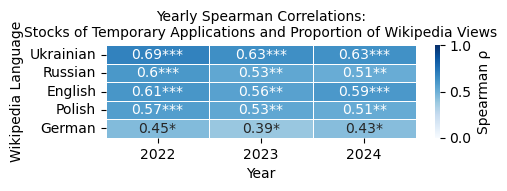

year,2022,2023,2024
language,,,
Ukrainian,0.69***,0.63***,0.63***
Russian,0.6***,0.53**,0.51**
English,0.61***,0.56**,0.59***
Polish,0.57***,0.53**,0.51**
German,0.45*,0.39*,0.43*


In [19]:
spearmanr_df_eu = rank_correlation(df_merged_eu, official_col="Temporary protection stocks", 
                                lang_cols=["Ukrainian", "Russian", "English", "Polish", "German"],
                                time_col="Years")
heatmap_eu = plot_yearly_spearman_heatmap_with_stars(spearmanr_df_eu, 
                                                     langs=["Ukrainian", "Russian", "English", "Polish", "German"], 
                                                     note="eu-5languages",
                                                     save=True)
heatmap_eu

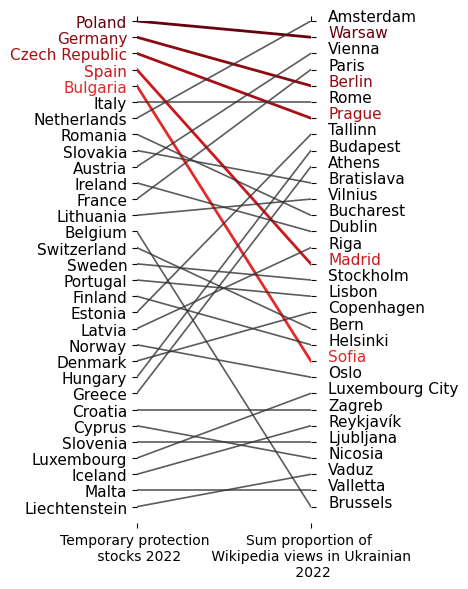

european & Ukrainian & 0.69*** \\ 


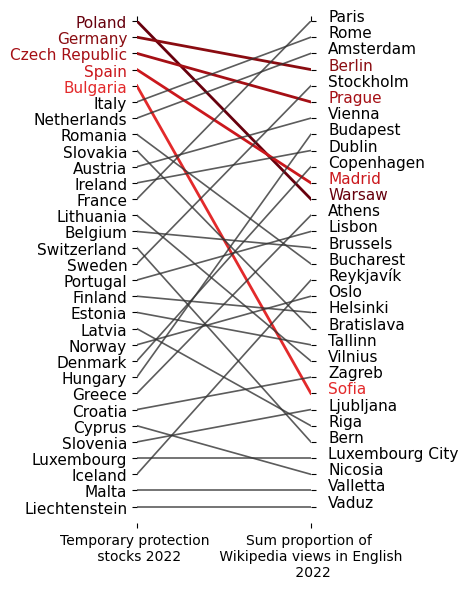

european & English & 0.61*** \\ 


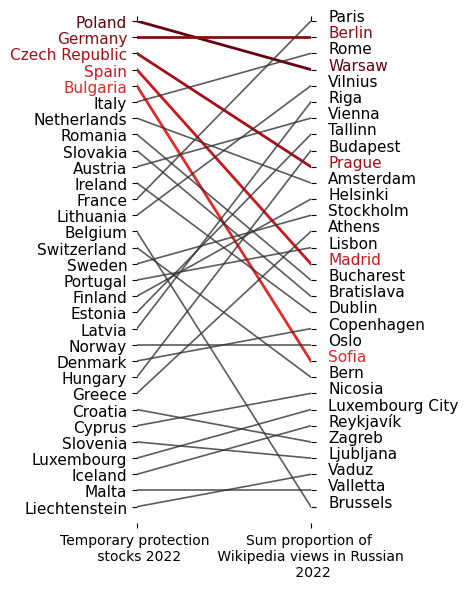

european & Russian & 0.6*** \\ 


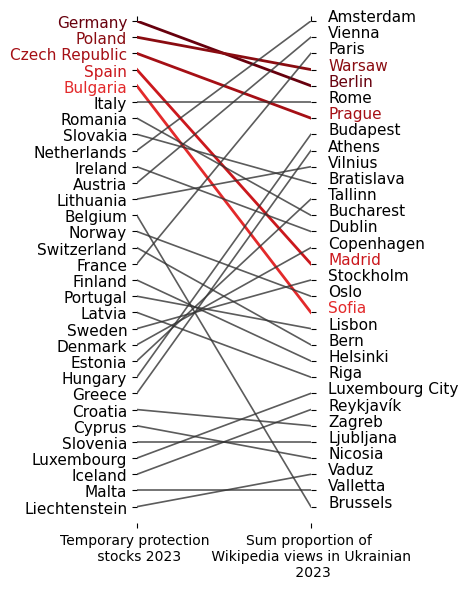

european & Ukrainian & 0.63*** \\ 


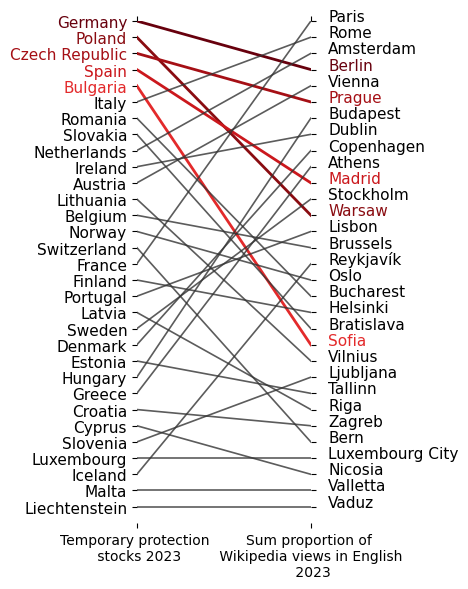

european & English & 0.56** \\ 


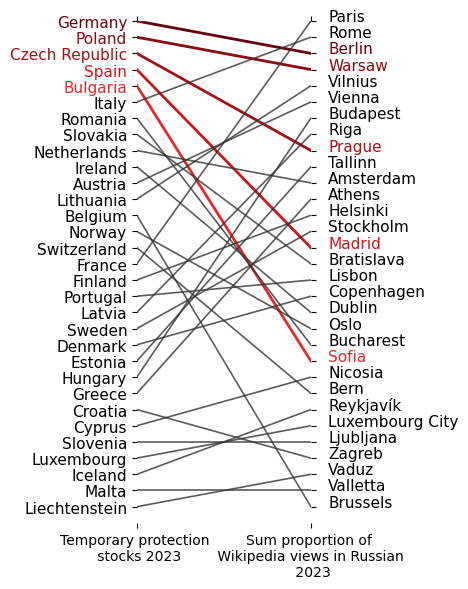

european & Russian & 0.53** \\ 


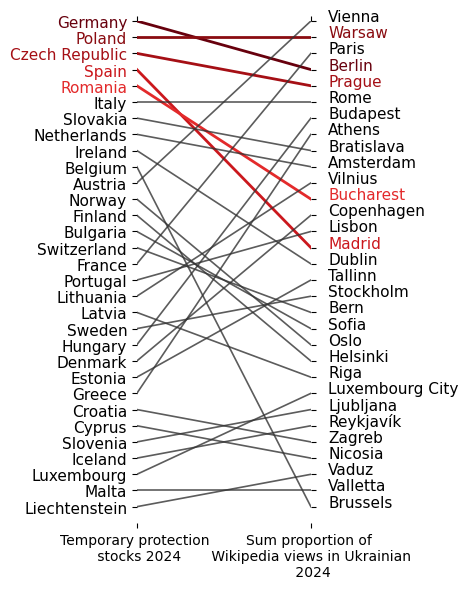

european & Ukrainian & 0.63*** \\ 


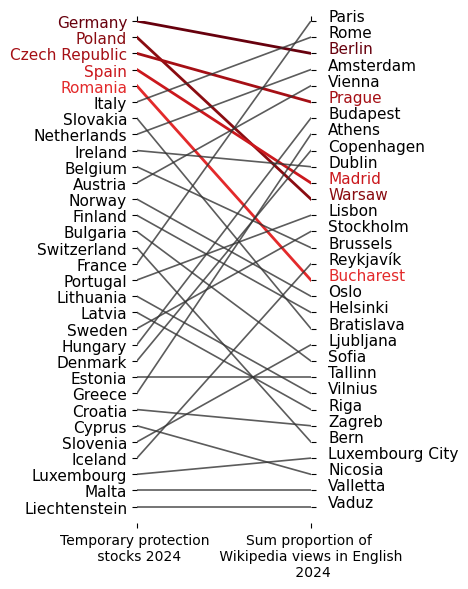

european & English & 0.59*** \\ 


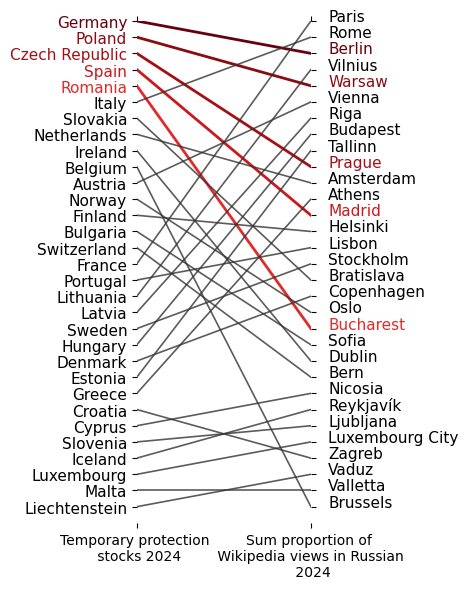

european & Russian & 0.51** \\ 


In [20]:
plt.rcParams['figure.figsize'] = 5, 6

for y in df_merged_eu["Years"].unique():
    for l in ["Ukrainian", "English", "Russian"]:
        ranks = df_merged_eu[df_merged_eu["Years"] == y][[l] + ["Temporary protection stocks"]]
        
        ranking_analysis(ranks, 
                         col1="Temporary protection stocks", 
                         col2=l, 
                         ranking_country=df_cc[["country", "capital"]].set_index("capital"), 
                         language=l, 
                         metric=f"EU-Wiki-{y}", 
                         note="european",
                         n1=f"Temporary protection \n stocks {y}", 
                         n2=f"Sum proportion of \n Wikipedia views in {l} \n {y}",
                         save=True)

## Poland

In [21]:
df_merged_pl = rank_poland_long.reset_index().merge(df_wikis_pl.reset_index()).set_index("Location")
df_merged_pl = df_merged_pl[["Years", "PESEL stocks"] + ["Ukrainian", "Russian", "English", "Polish", "German"]]
df_merged_pl

,Years,PESEL stocks,Ukrainian,Russian,English,Polish,German
Location,,,,,,,
Białystok,2022,3269,0.000012,0.000012,1.798638e-06,0.000074,0.000005
Bydgoszcz,2022,9245,0.000022,0.000006,1.374971e-06,0.000095,0.000007
Częstochowa,2022,4685,0.000018,0.000005,1.036020e-06,0.000061,0.000003
Gdańsk,2022,16499,0.000052,0.000023,6.744312e-06,0.000132,0.000025
Gdynia,2022,8754,0.000014,0.000004,1.261186e-06,0.000070,0.000006
Gliwice,2022,4934,0.000011,0.000004,8.221368e-07,0.000047,0.000007
Katowice,2022,10520,0.000032,0.000010,2.415691e-06,0.000094,0.000012
Kielce,2022,3385,0.000010,0.000003,6.443991e-07,0.000058,0.000002
Kraków,2022,29491,0.000066,0.000022,8.840304e-06,0.000181,0.000019


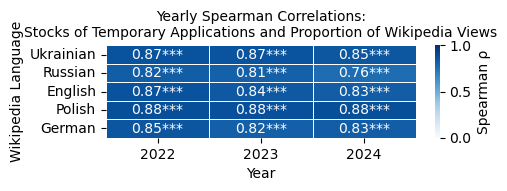

year,2022,2023,2024
language,,,
Ukrainian,0.87***,0.87***,0.85***
Russian,0.82***,0.81***,0.76***
English,0.87***,0.84***,0.83***
Polish,0.88***,0.88***,0.88***
German,0.85***,0.82***,0.83***


In [22]:
spearmanr_df_pl = rank_correlation(df_merged_pl, official_col="PESEL stocks", time_col="Years")
heatmap_pl = plot_yearly_spearman_heatmap_with_stars(spearmanr_df_pl, 
                                                     langs=["Ukrainian", "Russian", "English", "Polish", "German"],
                                                     note="pl", 
                                                     save=True)
heatmap_pl

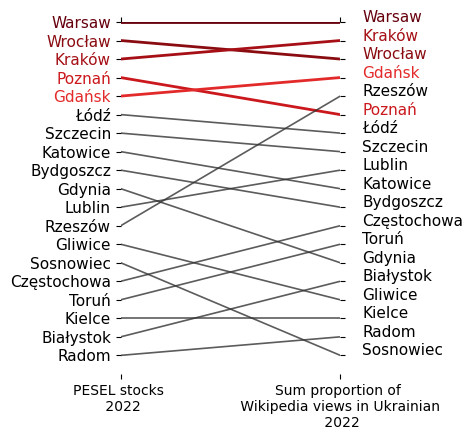

polish & Ukrainian & 0.87*** \\ 


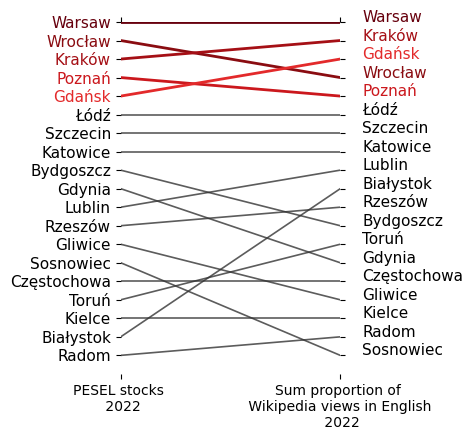

polish & English & 0.87*** \\ 


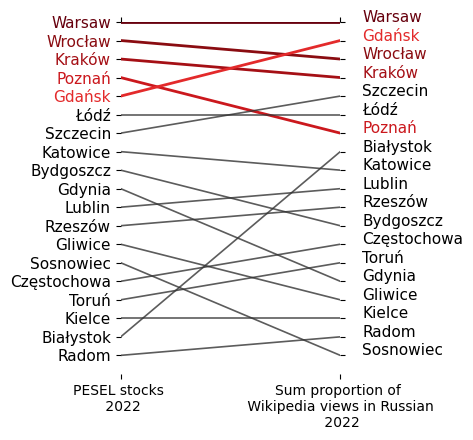

polish & Russian & 0.82*** \\ 


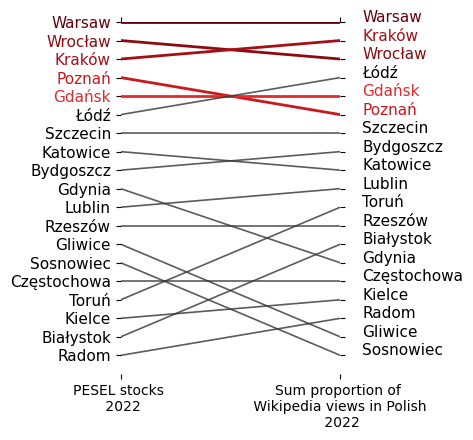

polish & Polish & 0.88*** \\ 


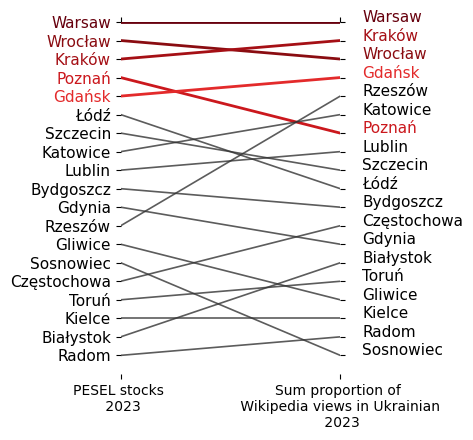

polish & Ukrainian & 0.87*** \\ 


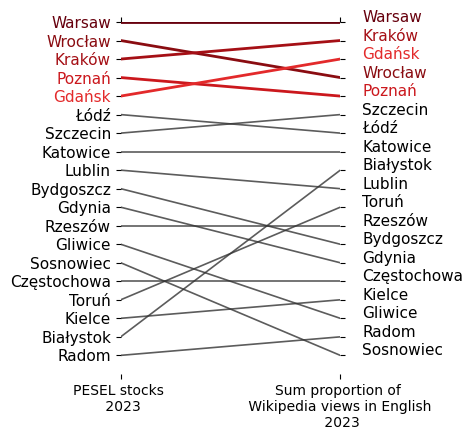

polish & English & 0.84*** \\ 


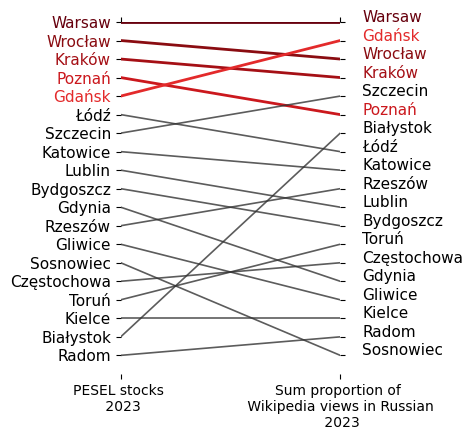

polish & Russian & 0.81*** \\ 


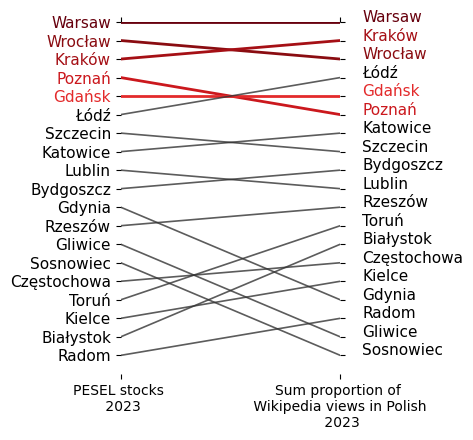

polish & Polish & 0.88*** \\ 


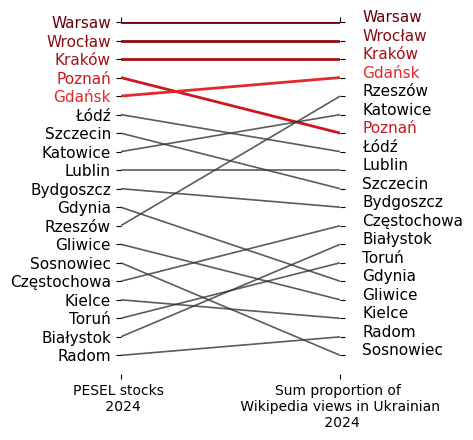

polish & Ukrainian & 0.85*** \\ 


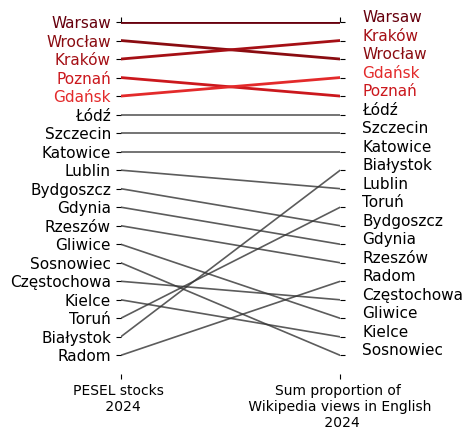

polish & English & 0.83*** \\ 


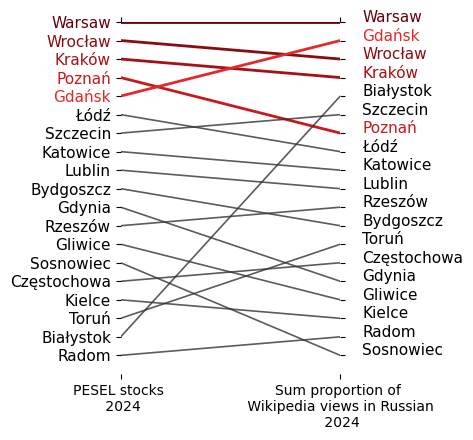

polish & Russian & 0.76*** \\ 


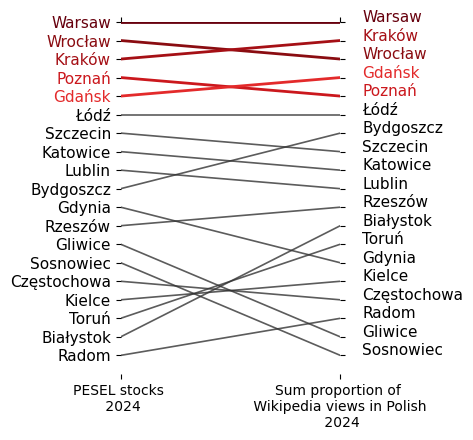

polish & Polish & 0.88*** \\ 


In [23]:
plt.rcParams['figure.figsize'] = 5, 4.5

for y in [2022, 2023, 2024]:
    for l in ["Ukrainian", "English", "Russian", "Polish"]:
        ranks = df_merged_pl[df_merged_pl["Years"] == y][[l] + ["PESEL stocks"]]
        
        ranking_analysis(ranks, 
                         col1="PESEL stocks", 
                         col2=l, 
                         ranking_country=None, 
                         language=l, 
                         metric=f"PL-Wiki-{y}", 
                         note="polish",
                         n1=f"PESEL stocks \n {y}", 
                         n2=f"Sum proportion of \n Wikipedia views in {l} \n {y}",
                         save=True)

## Germany

In [24]:
df_merged_de = rank_germany_long.reset_index().merge(df_wikis_de.reset_index()).set_index("Location")
df_merged_de = df_merged_de[["Years", "Temporary protection stocks"] + ["Ukrainian", "Russian", "English", "Polish", "German"]]
df_merged_de

,Years,Temporary protection stocks,Ukrainian,Russian,English,Polish,German
Location,,,,,,,
Aachen,2022,5950,0.000010,0.000008,5.398478e-06,0.000022,0.000033
Augsburg,2022,5140,0.000009,0.000005,2.631099e-06,0.000009,0.000033
Berlin,2022,50495,0.000061,0.000038,2.096718e-05,0.000082,0.000146
Bielefeld,2022,4215,0.000007,0.000003,1.591660e-06,0.000007,0.000026
Bochum,2022,7525,0.000007,0.000003,1.321329e-06,0.000006,0.000019
...,...,...,...,...,...,...,...
Oberhausen,2024,3510,0.000003,0.000001,4.610927e-07,0.000003,0.000014
Rostock,2024,3160,0.000008,0.000007,1.785830e-06,0.000013,0.000025
Stuttgart,2024,7210,0.000027,0.000013,6.731142e-06,0.000027,0.000047


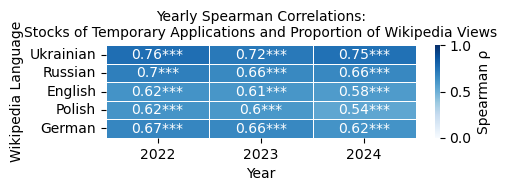

year,2022,2023,2024
language,,,
Ukrainian,0.76***,0.72***,0.75***
Russian,0.7***,0.66***,0.66***
English,0.62***,0.61***,0.58***
Polish,0.62***,0.6***,0.54***
German,0.67***,0.66***,0.62***


In [25]:
spearmanr_df_de = rank_correlation(df_merged_de, official_col="Temporary protection stocks", time_col="Years")
heatmap_de = plot_yearly_spearman_heatmap_with_stars(spearmanr_df_de, 
                                                     langs=["Ukrainian", "Russian", "English", "Polish", "German"], 
                                                     note="de",
                                                     save=True)
heatmap_de

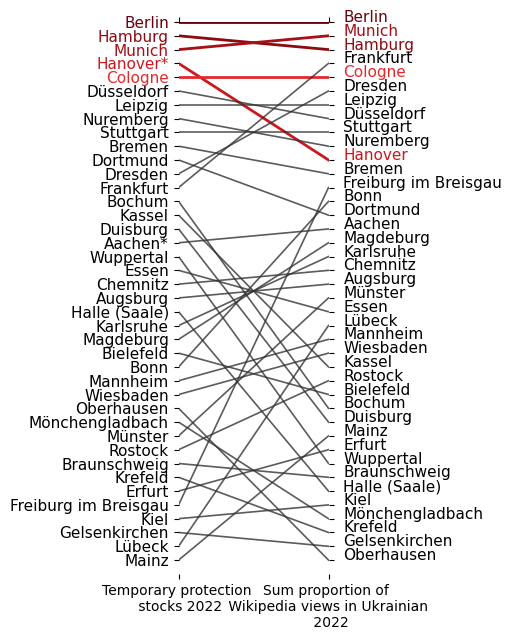

german & Ukrainian & 0.76*** \\ 


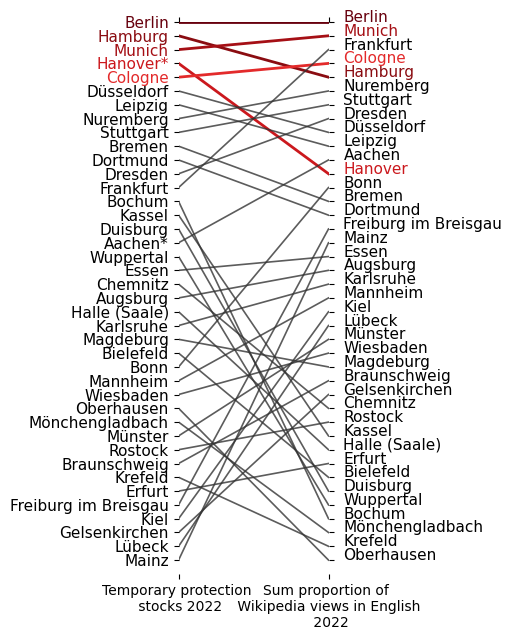

german & English & 0.62*** \\ 


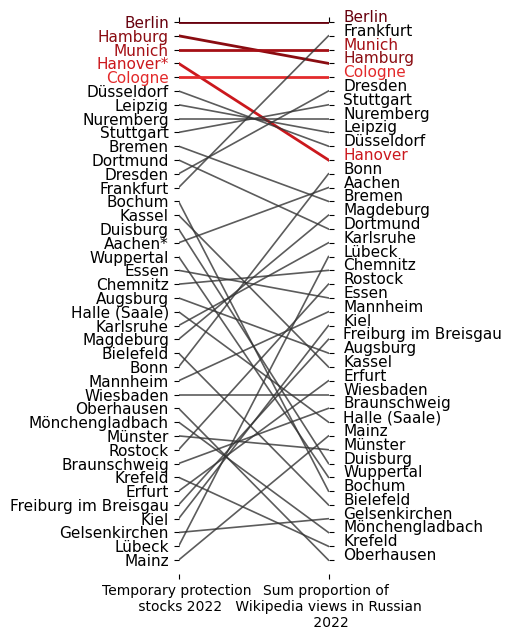

german & Russian & 0.7*** \\ 


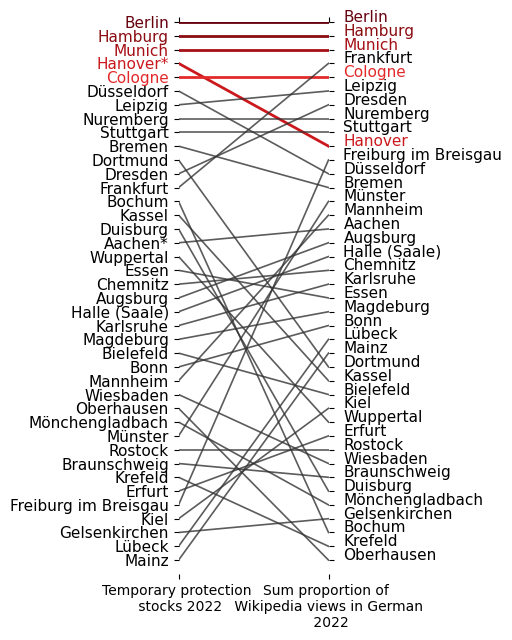

german & German & 0.67*** \\ 


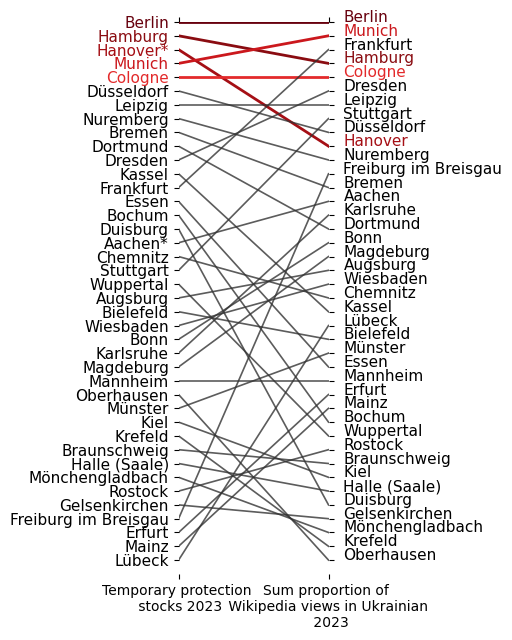

german & Ukrainian & 0.72*** \\ 


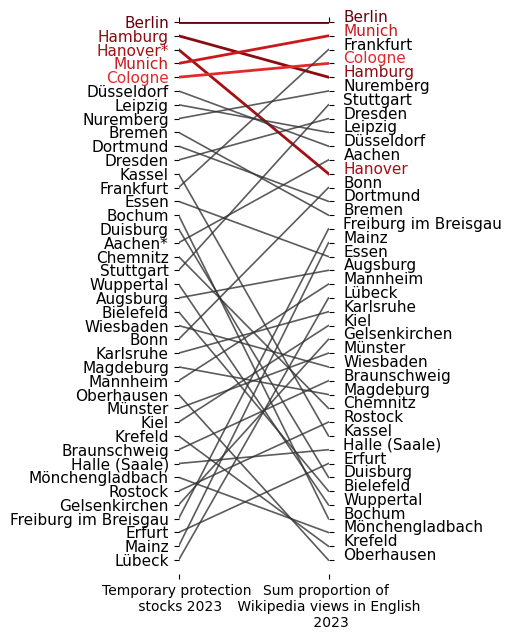

german & English & 0.61*** \\ 


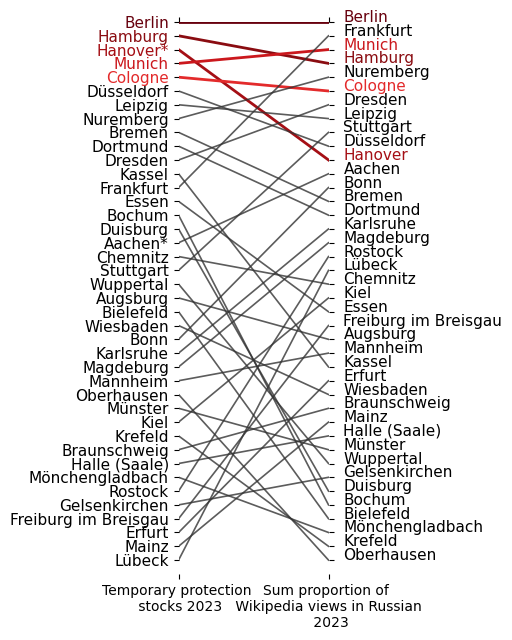

german & Russian & 0.66*** \\ 


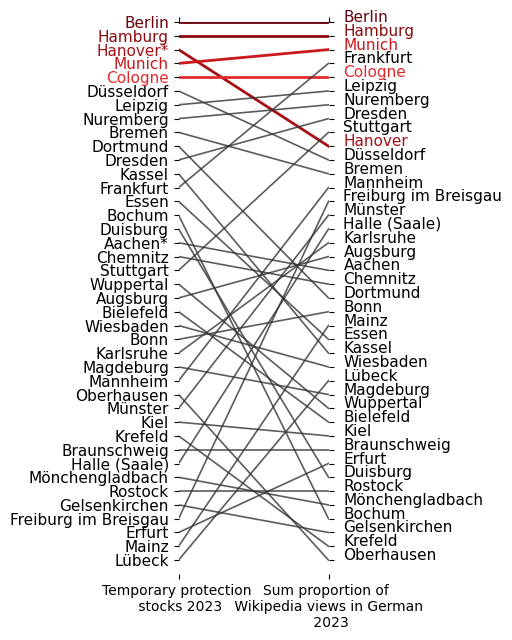

german & German & 0.66*** \\ 


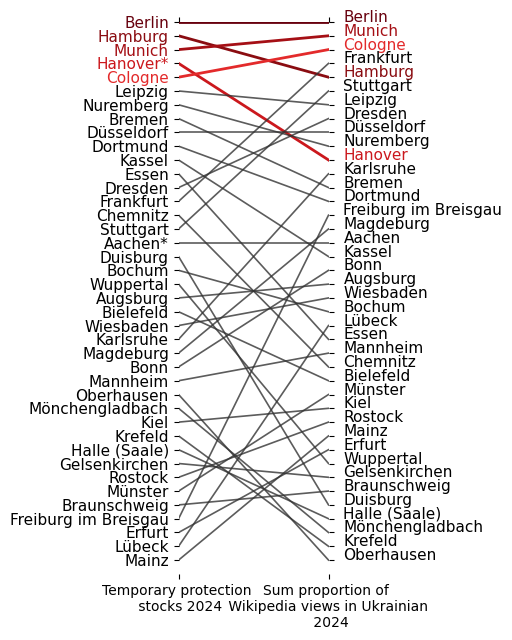

german & Ukrainian & 0.75*** \\ 


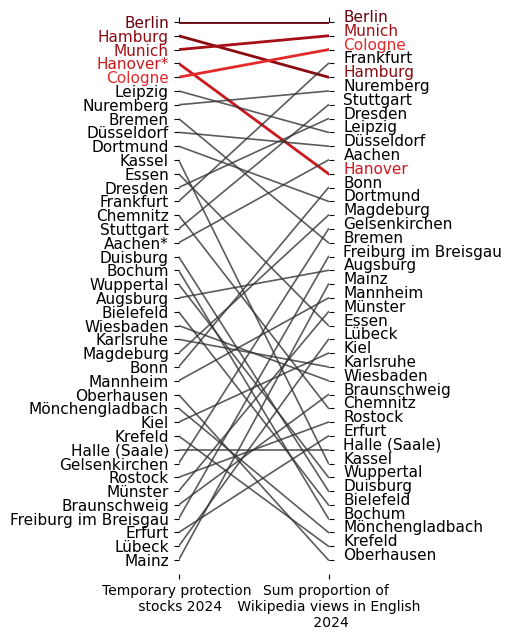

german & English & 0.58*** \\ 


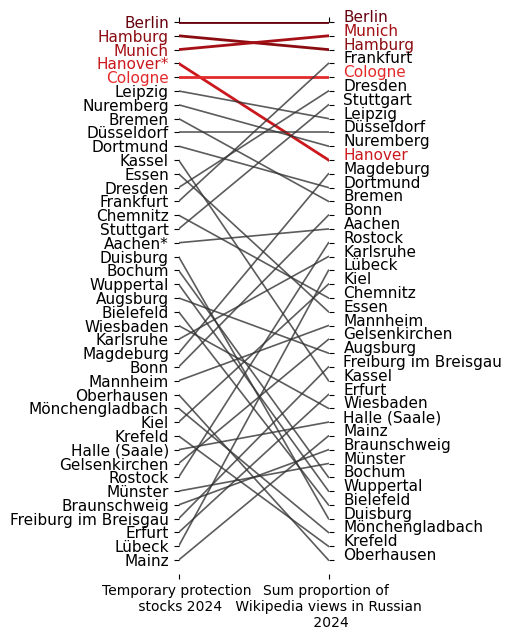

german & Russian & 0.66*** \\ 


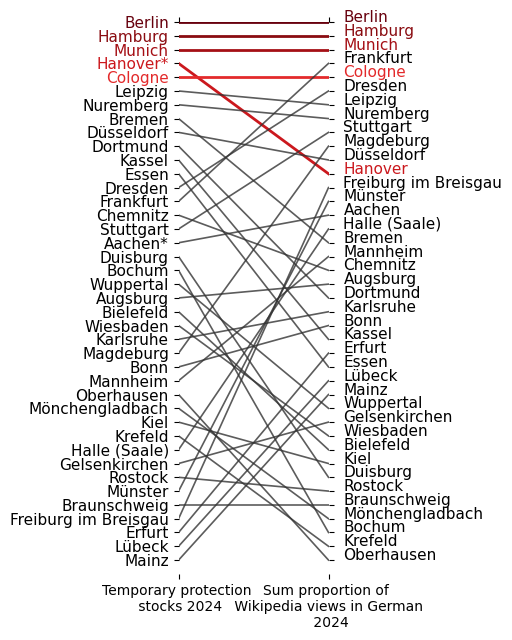

german & German & 0.62*** \\ 


In [26]:
plt.rcParams['figure.figsize'] = 5.5, 6.5

for y in [2022, 2023, 2024]:
    for l in ["Ukrainian", "English", "Russian", "German"]:
        ranks = df_merged_de[df_merged_de["Years"] == y][[l] + ["Temporary protection stocks"]]
        
        ranking_analysis(ranks, 
                         col1="Temporary protection stocks", 
                         col2=l, 
                         ranking_country=None, 
                         language=l, 
                         metric=f"DE-Wiki-{y}", note="german",
                         n1=f"Temporary protection \n stocks {y}", 
                         n2=f"Sum proportion of \n Wikipedia views in {l} \n {y}",
                         save=True)

### Testing top 19 most populous German cities 

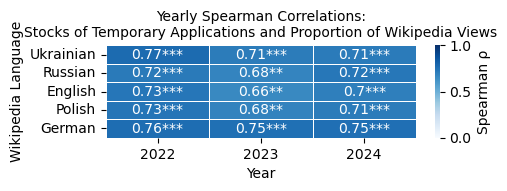

In [27]:
## Testing only 19 cities in Germany to be more comparable to spearmanr for Poland
top19_de = ["Berlin", "Hamburg", "Munich", "Cologne", "Frankfurt", "Stuttgart", "Düsseldorf", "Leipzig", "Dortmund", "Essen", "Bremen", "Dresden", "Hanover", "Nuremberg", "Duisburg", "Bochum", "Wuppertal", "Bielefeld", "Bonn"]
spearmanr_df_de = rank_correlation(df_merged_de.loc[top19_de], official_col="Temporary protection stocks", time_col="Years")
heatmap_de = plot_yearly_spearman_heatmap_with_stars(spearmanr_df_de, 
                                                     langs=["Ukrainian", "Russian", "English", "Polish", "German"], 
                                                     note="de")

# Latex summary:

In [28]:
# Example: assume your heatmaps have columns [2022, 2023, 2024]
# Add hierarchical column index
heatmap_eu.columns = pd.MultiIndex.from_product([["Europe"], heatmap_eu.columns])
heatmap_pl.columns = pd.MultiIndex.from_product([["Poland"], heatmap_pl.columns])
heatmap_de.columns = pd.MultiIndex.from_product([["Germany"], heatmap_de.columns])

In [29]:
# Concatenate them side by side
combined = pd.concat([heatmap_eu, heatmap_pl, heatmap_de], axis=1)
# Rename column index (the header axis)
combined.columns.names = [combined.columns.names[0], "Wikipedia language"]
# Drop index name
combined.index.name = None  

# Export LaTeX with multicolumn headers and without the "language & & & ..." row
latex_table = combined.to_latex(
    multicolumn=True, 
    multicolumn_format='c',
    index=True,
    header=True
)

# Insert \cmidrule lines after the top header row
latex_table = latex_table.replace(
    "{Germany} \\\\",
    "{Germany} \\\\\n\\cmidrule(lr){2-4} \\cmidrule(lr){5-7} \\cmidrule(lr){8-10}"
)

print(latex_table)

\begin{tabular}{llllllllll}
\toprule
 & \multicolumn{3}{c}{Europe} & \multicolumn{3}{c}{Poland} & \multicolumn{3}{c}{Germany} \\
\cmidrule(lr){2-4} \cmidrule(lr){5-7} \cmidrule(lr){8-10}
Wikipedia language & 2022 & 2023 & 2024 & 2022 & 2023 & 2024 & 2022 & 2023 & 2024 \\
\midrule
Ukrainian & 0.69*** & 0.63*** & 0.63*** & 0.87*** & 0.87*** & 0.85*** & 0.77*** & 0.71*** & 0.71*** \\
Russian & 0.6*** & 0.53** & 0.51** & 0.82*** & 0.81*** & 0.76*** & 0.72*** & 0.68** & 0.72*** \\
English & 0.61*** & 0.56** & 0.59*** & 0.87*** & 0.84*** & 0.83*** & 0.73*** & 0.66** & 0.7*** \\
Polish & 0.57*** & 0.53** & 0.51** & 0.88*** & 0.88*** & 0.88*** & 0.73*** & 0.68** & 0.71*** \\
German & 0.45* & 0.39* & 0.43* & 0.85*** & 0.82*** & 0.83*** & 0.76*** & 0.75*** & 0.75*** \\
\bottomrule
\end{tabular}



## Using the calculation of DELTA (from our paper's old version)

In [30]:
df_wikipedia_stats = pd.read_csv("data_cities_EU/preprocessed/stats_relative_change.csv")
df_wikipedia_stats.columns = ["Location", "Language"] + df_wikipedia_stats.columns[2:].tolist()
df_wikipedia_stats = df_wikipedia_stats[df_wikipedia_stats["Location"] != "Poland"]

df_wikipedia_stats_pl = pd.read_csv("data_cities_PL/preprocessed/stats_relative_change.csv")
df_wikipedia_stats_pl.columns = ["Location", "Language"] + df_wikipedia_stats_pl.columns[2:].tolist()
df_wikipedia_stats_pl = df_wikipedia_stats_pl[df_wikipedia_stats_pl["Location"] != "Poland"]

df_wikipedia_stats_de = pd.read_csv("data_cities_DE/preprocessed/stats_relative_change.csv")
df_wikipedia_stats_de.columns = ["Location", "Language"] + df_wikipedia_stats_de.columns[2:].tolist()

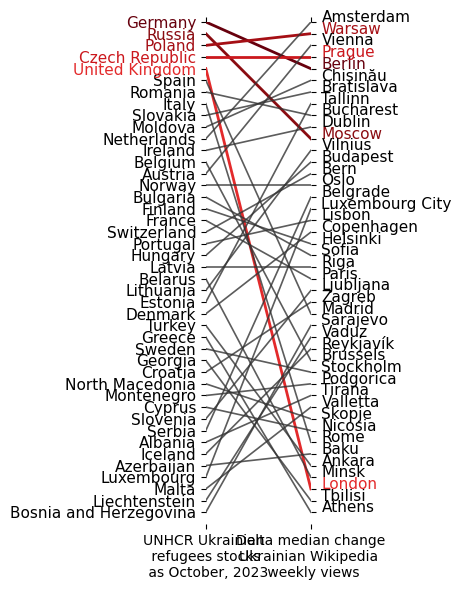

european & Ukrainian & 0.52*** \\ 


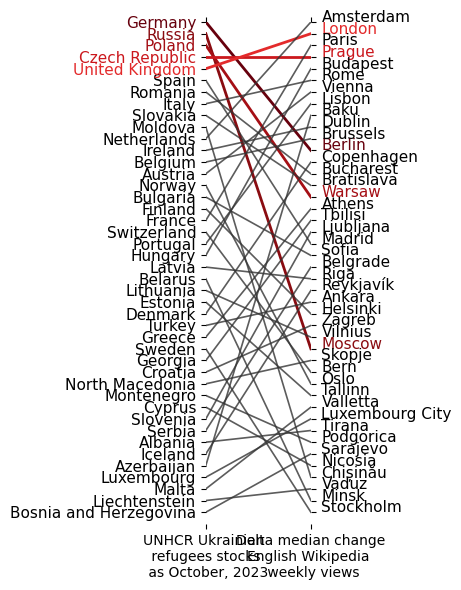

european & English & 0.52*** \\ 


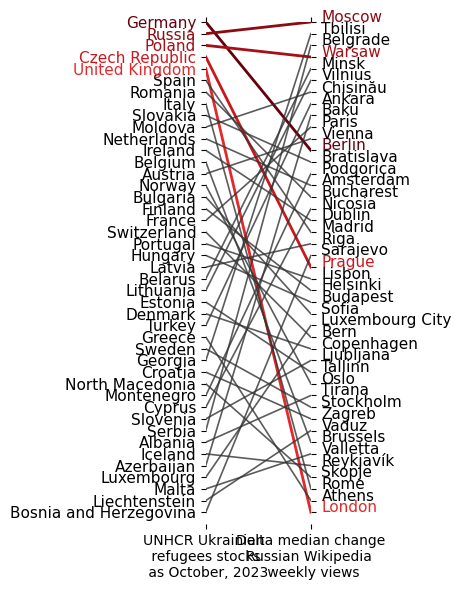

european & Russian & 0.24 \\ 


In [31]:
plt.rcParams['figure.figsize'] = 5, 6

for wikipedia_metric, note in [("diff_weekly_median", "median change")]:
    df_wikipedia_stats_m = df_wikipedia_stats[["Location", "Language", wikipedia_metric]]
    df_wikipedia_stats_m = pd.pivot_table(df_wikipedia_stats_m, index="Location", columns="Language", values=wikipedia_metric)
    
    for l in ["Ukrainian", "English", "Russian"]:
        rank_WIKIPEDIA = df_wikipedia_stats_m.sort_values(by=[(l)], ascending=False)
        ranks = rank_WIKIPEDIA.merge(rank_UNHCR2, left_index=True, right_index=True)

        ranking_analysis(ranks, 
                         col1="UNHCR Ukrainian refugees stocks", 
                         col2=l, 
                         ranking_country=rank_UNHCR, 
                         language=l, 
                         metric="UNHCR-"+wikipedia_metric, note="european",
                         n1=f"UNHCR Ukrainian \n refugees stocks \n as October, 2023", 
                         n2=f"Delta {note}\n{l} Wikipedia \n weekly views")

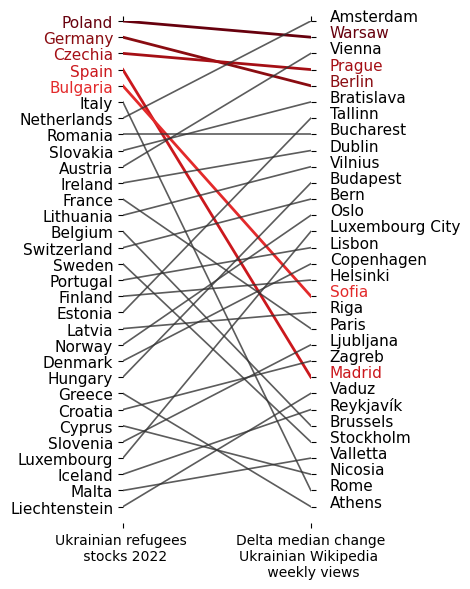

european_eurostat & Ukrainian & 0.53** \\ 


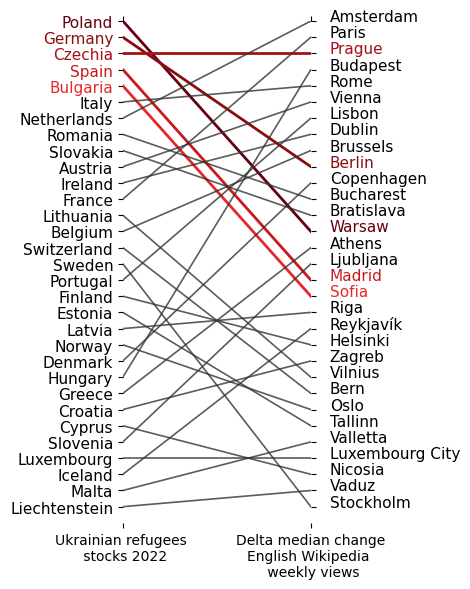

european_eurostat & English & 0.56*** \\ 


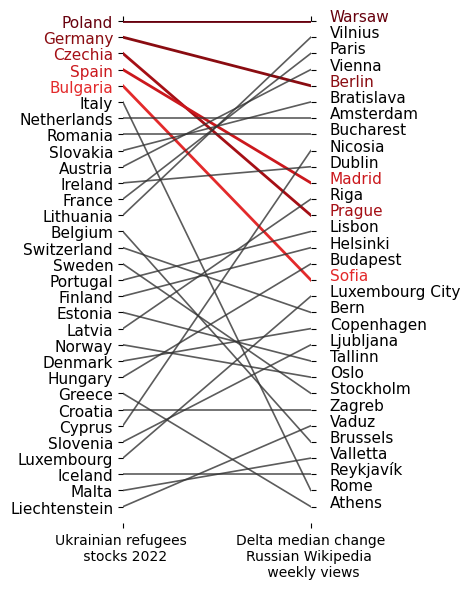

european_eurostat & Russian & 0.59*** \\ 


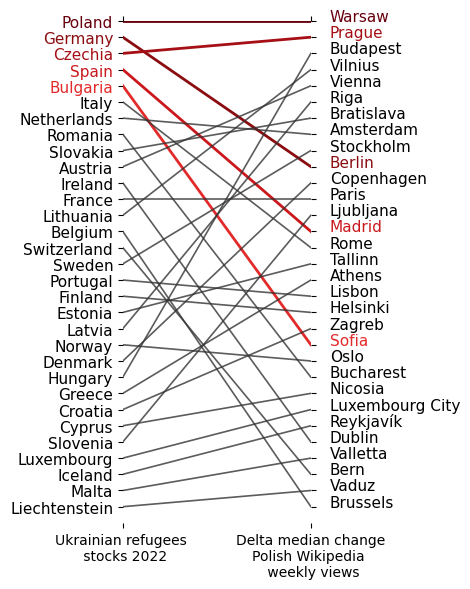

european_eurostat & Polish & 0.46** \\ 


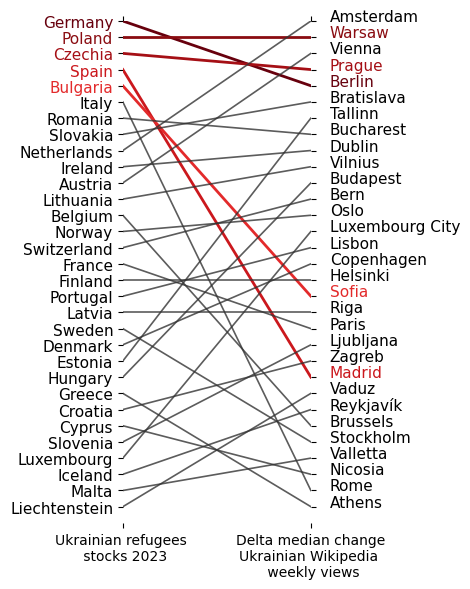

european_eurostat & Ukrainian & 0.54** \\ 


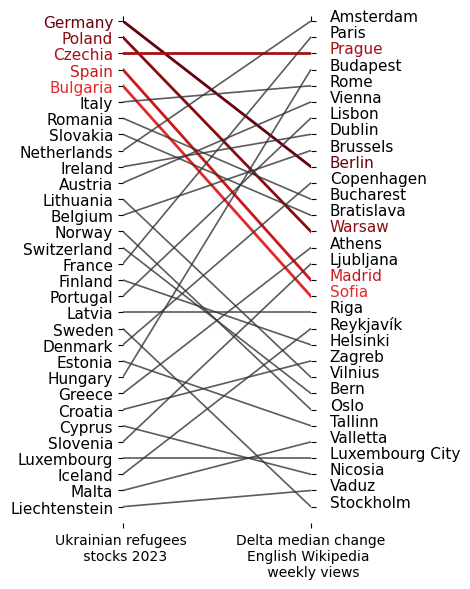

european_eurostat & English & 0.54** \\ 


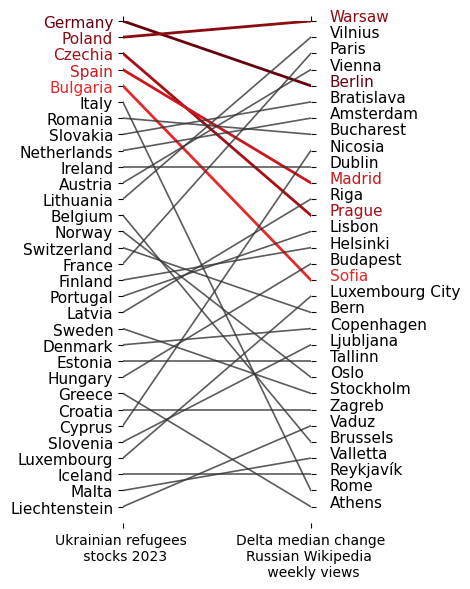

european_eurostat & Russian & 0.57*** \\ 


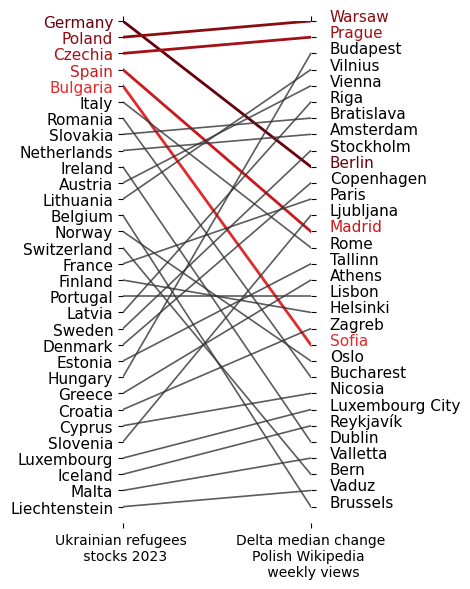

european_eurostat & Polish & 0.42* \\ 


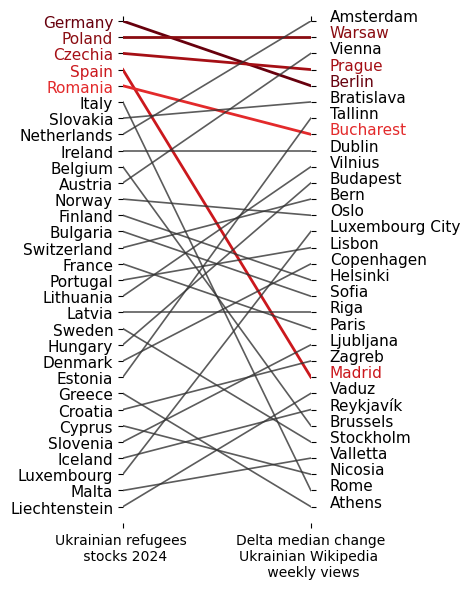

european_eurostat & Ukrainian & 0.54** \\ 


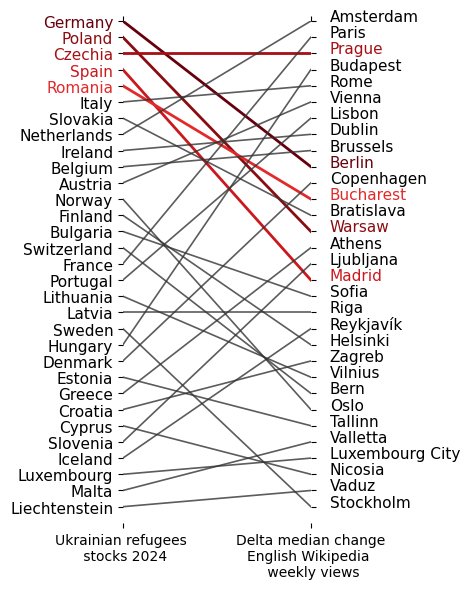

european_eurostat & English & 0.59*** \\ 


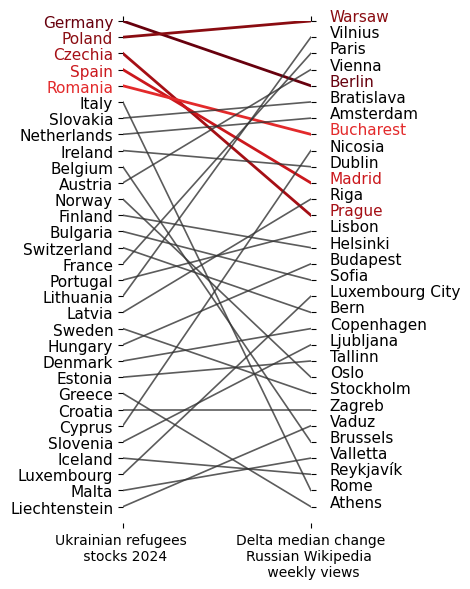

european_eurostat & Russian & 0.54** \\ 


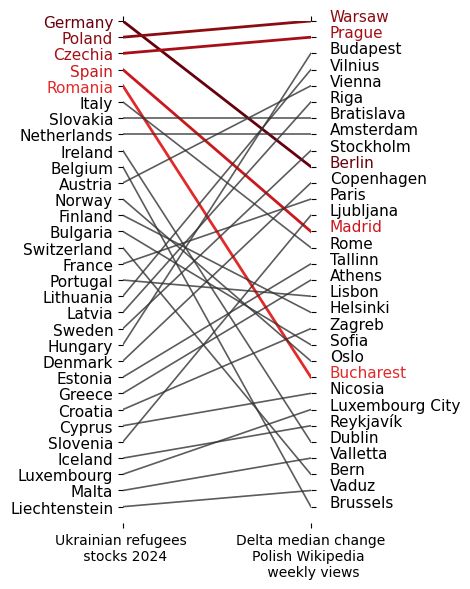

european_eurostat & Polish & 0.38* \\ 


In [32]:
plt.rcParams['figure.figsize'] = 5, 6

for wikipedia_metric, note in [("diff_weekly_median", "median change")]:
    df_wikipedia_stats_m = df_wikipedia_stats[["Location", "Language", wikipedia_metric]]
    df_wikipedia_stats_m = pd.pivot_table(df_wikipedia_stats_m, index="Location", columns="Language", values=wikipedia_metric)
    
    for y in [2022, 2023, 2024]:
        for l in ["Ukrainian", "English", "Russian", "Polish"]:
            rank_WIKIPEDIA = df_wikipedia_stats_m.sort_values(by=[(l)], ascending=False)
            rank_eurostat = rank_EU2_long[rank_EU2_long["Years"] == y][["Temporary protection stocks"]]

            ranks = rank_WIKIPEDIA.merge(rank_eurostat, left_index=True, right_index=True)
            
            ranking_analysis(ranks, 
                             col1="Temporary protection stocks", 
                             col2=l, 
                             ranking_country=rank_EU, 
                             language=l, 
                             metric="eurostat-"+wikipedia_metric, 
                             note="european_eurostat", 
                             n1=f"Ukrainian refugees \n stocks {y}", 
                             n2=f"Delta {note}\n{l} Wikipedia \n weekly views")

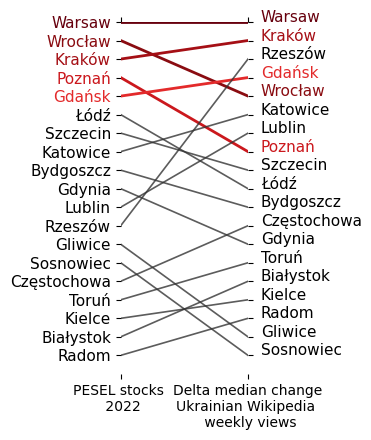

polish & Ukrainian & 0.79*** \\ 


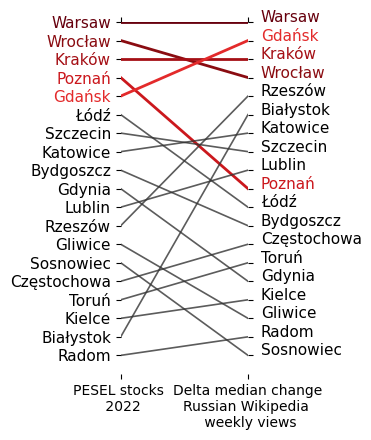

polish & Russian & 0.69** \\ 


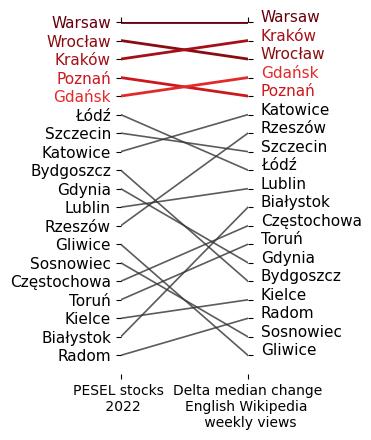

polish & English & 0.81*** \\ 


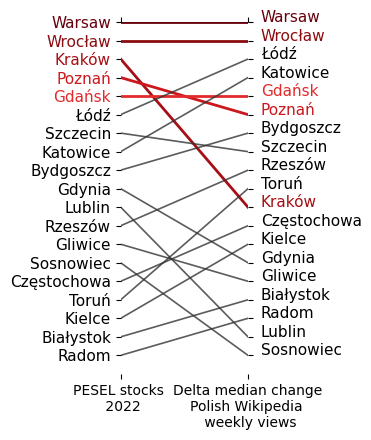

polish & Polish & 0.76*** \\ 


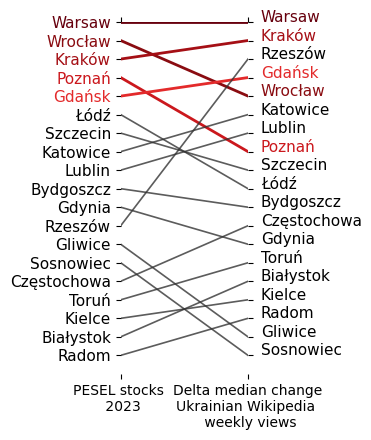

polish & Ukrainian & 0.81*** \\ 


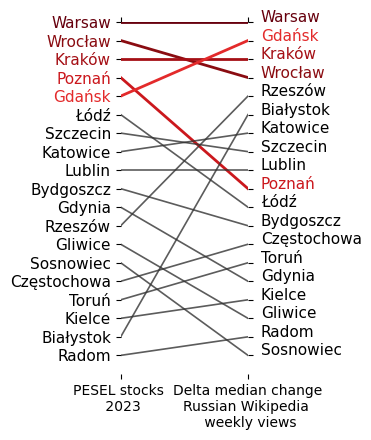

polish & Russian & 0.7*** \\ 


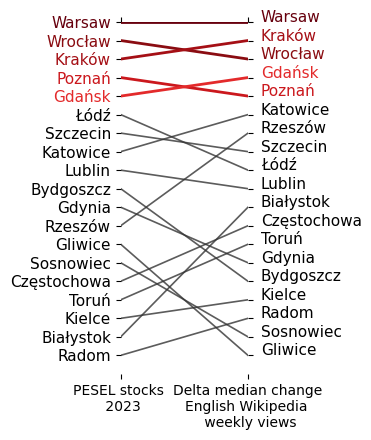

polish & English & 0.82*** \\ 


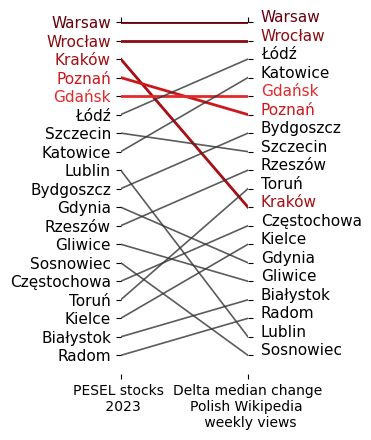

polish & Polish & 0.74*** \\ 


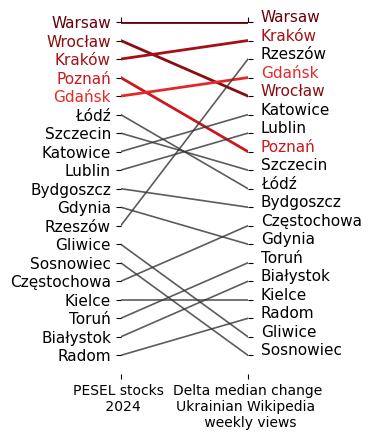

polish & Ukrainian & 0.81*** \\ 


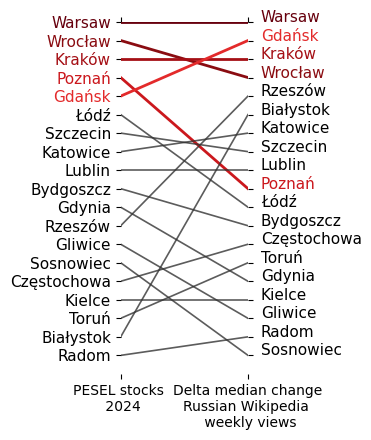

polish & Russian & 0.7*** \\ 


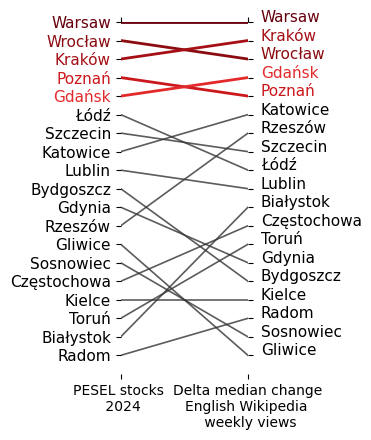

polish & English & 0.82*** \\ 


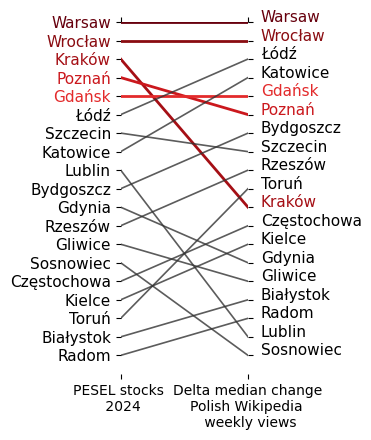

polish & Polish & 0.73*** \\ 


In [33]:
plt.rcParams["figure.figsize"] = (4, 4.5)

for wikipedia_metric, note in [("diff_weekly_median", "median change")]:
    df_wikipedia_stats_m_pl = df_wikipedia_stats_pl[["Location", "Language", wikipedia_metric]]
    df_wikipedia_stats_m_pl = pd.pivot_table(df_wikipedia_stats_m_pl, index="Location", columns="Language", values=wikipedia_metric)

    for y in [2022, 2023, 2024]:
        for l in ["Ukrainian", "Russian", "English", "Polish"]:
            rank_WIKIPEDIA_PL = df_wikipedia_stats_m_pl.sort_values(by=[(l)], ascending=False)
            rp = rank_poland_long[rank_poland_long["Years"] == y][["PESEL stocks"]]
            
            ranks_pl = rank_WIKIPEDIA_PL.merge(rp, left_index=True, right_index=True)

            ranking_analysis(ranks_pl, 
                             col1="PESEL stocks", 
                             col2=l, 
                             ranking_country=None, 
                             language=l, 
                             metric="PESEL-"+wikipedia_metric, 
                             note="polish",
                             n1=f"PESEL stocks \n {y}", 
                             n2=f"Delta {note}\n{l} Wikipedia \n weekly views")            

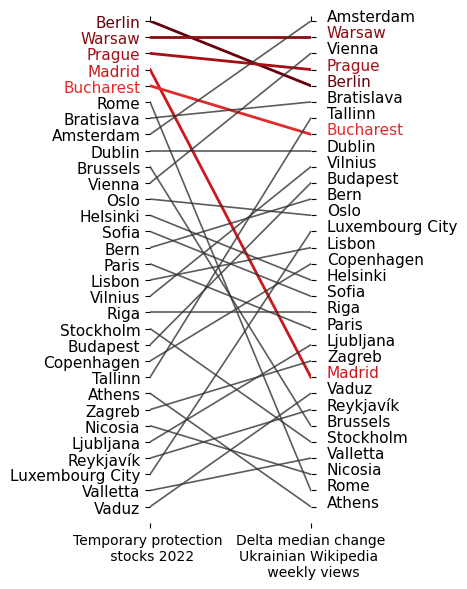

german & Ukrainian & 0.54** \\ 


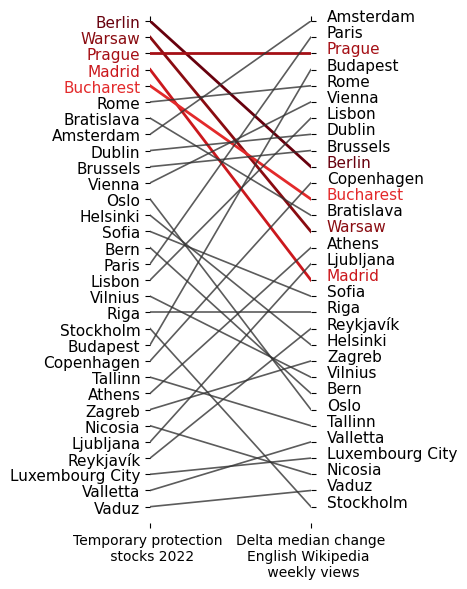

german & English & 0.59*** \\ 


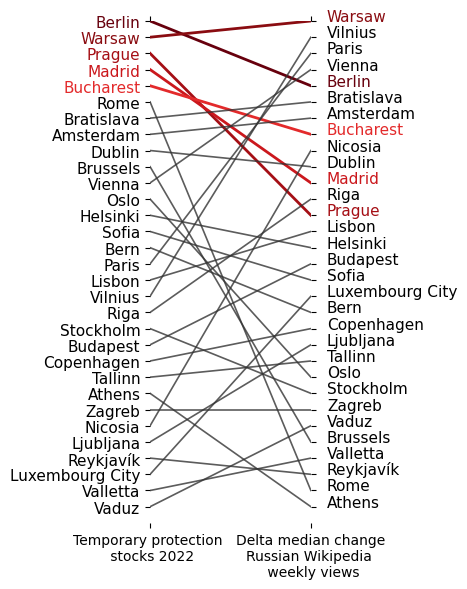

german & Russian & 0.54** \\ 


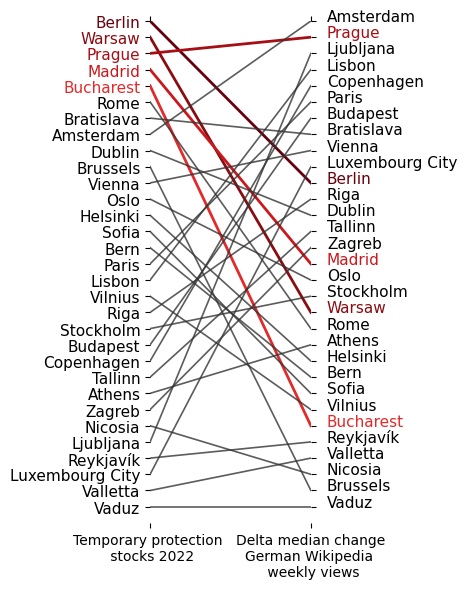

german & German & 0.21 \\ 


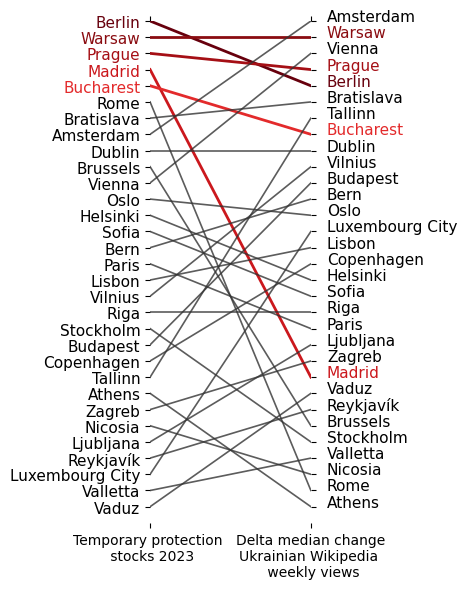

german & Ukrainian & 0.54** \\ 


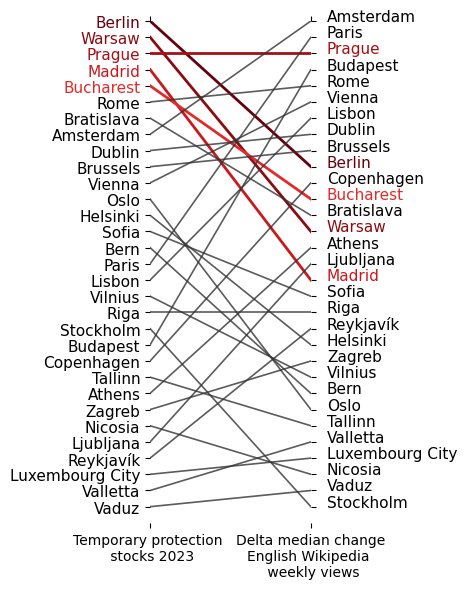

german & English & 0.59*** \\ 


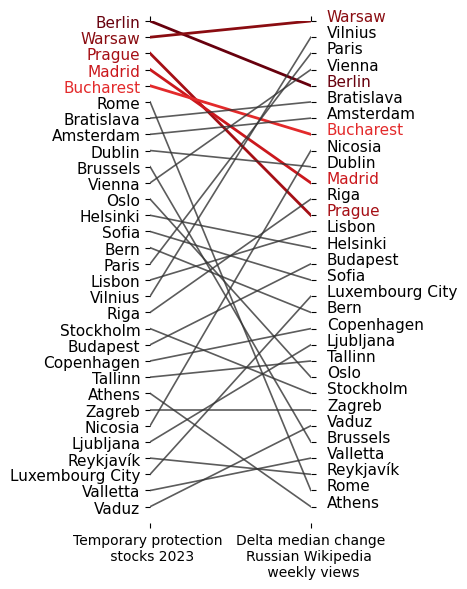

german & Russian & 0.54** \\ 


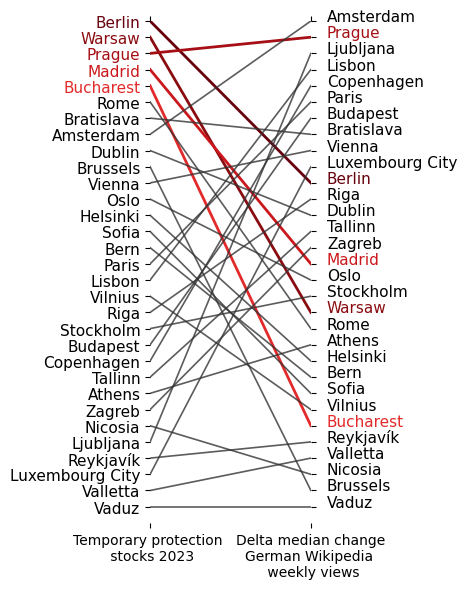

german & German & 0.21 \\ 


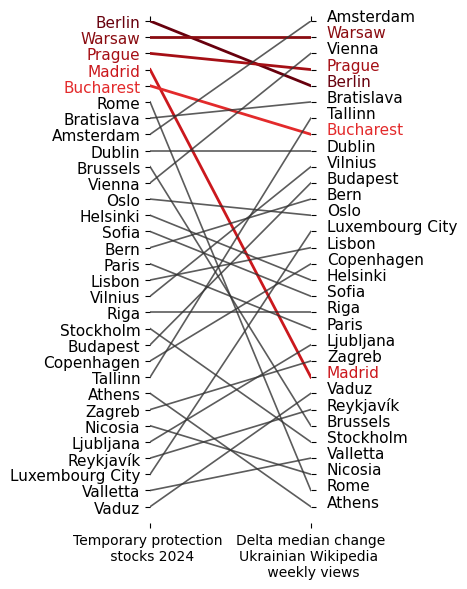

german & Ukrainian & 0.54** \\ 


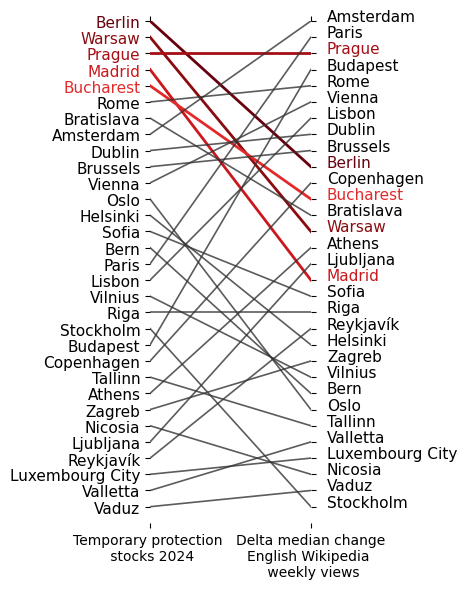

german & English & 0.59*** \\ 


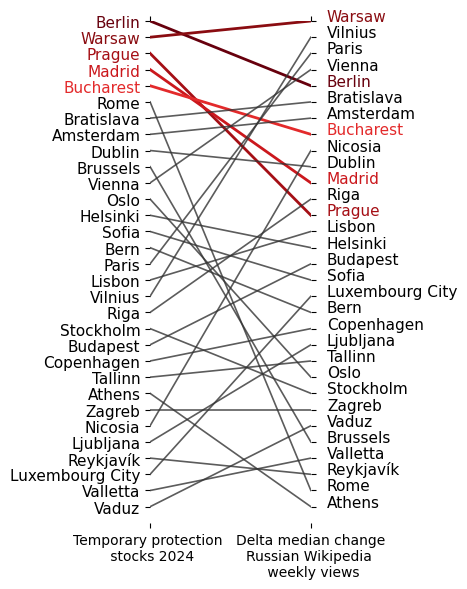

german & Russian & 0.54** \\ 


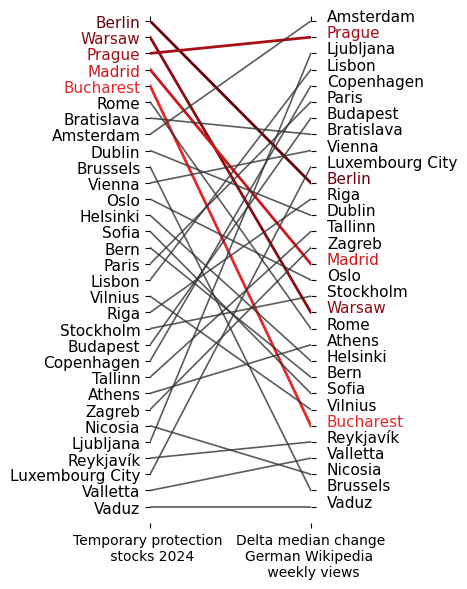

german & German & 0.21 \\ 


In [34]:
plt.rcParams['figure.figsize'] = 5, 6

for wikipedia_metric, note in [("diff_weekly_median", "median change")]:
    df_wikipedia_stats_m_de = df_wikipedia_stats_de[["Location", "Language", wikipedia_metric]]
    df_wikipedia_stats_m_de = pd.pivot_table(df_wikipedia_stats_m_de, index="Location", columns="Language", values=wikipedia_metric)
    
    for y in [2022, 2023, 2024]:
        for l in ["Ukrainian", "English", "Russian", "German"]:
            rank_WIKIPEDIA_DE = df_wikipedia_stats_m_de.sort_values(by=[(l)], ascending=False)
            rg = rank_germany_long[rank_germany_long["Years"] == y][["Temporary protection stocks"]]
            
            ranks_de = rank_WIKIPEDIA_DE.merge(rg, left_index=True, right_index=True)
                        
            ranking_analysis(ranks, 
                             col1="Temporary protection stocks", 
                             col2=l, 
                             ranking_country=None, 
                             language=l, 
                             metric="GERMAN-"+wikipedia_metric, 
                             note="german",
                             n1=f"Temporary protection \n stocks {y}", 
                             n2=f"Delta {note}\n{l} Wikipedia \n weekly views")